In [1]:
import os
import numpy as np
import pandas as pd
import xgboost as xgb
import matplotlib.pyplot as plt
from xgboost import plot_importance, plot_tree
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import accuracy_score,classification_report
from sklearn.metrics import roc_curve, auc

# Time series decomposition
from statsmodels.tsa.seasonal import seasonal_decompose

# Chart drawing
import plotly as py
import plotly.io as pio
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

# Mute sklearn warnings
from warnings import simplefilter
simplefilter(action='ignore', category=FutureWarning)
simplefilter(action='ignore', category=DeprecationWarning)

# Show charts when running kernel
init_notebook_mode(connected=True)

# Change default background color for all visualizations
layout=go.Layout(paper_bgcolor='rgba(0,0,0,0)', plot_bgcolor='rgba(250,250,250,0.8)')
fig = go.Figure(layout=layout)
templated_fig = pio.to_templated(fig)
pio.templates['my_template'] = templated_fig.layout.template
pio.templates.default = 'my_template'

In [2]:
# Split data into training/validation and test sets based on dates
start_date = '1900-01-31'
end_date = '2025-07-20'

In [3]:
stock_name = 'XRM'

# Technical Analysis
file_path_1 = '/Users/edocampione/Desktop/Meng Engineering Science/4YP/data/ExxonMobil_CRSP_daily_data_alltime.csv' # Daily data (CRSP)

# Fundamental Analysis
file_path_2 = '/Users/edocampione/Desktop/Meng Engineering Science/4YP/data/ExxonMobil_Compustat_q_data_alltime.csv' # Fundamentals (Compustat)
file_path_3 = '/Users/edocampione/Desktop/Meng Engineering Science/4YP/data/ExxonMobil_Compustat_quarterly_ratiodata_alltime.csv' # Ratios (Compustat)

In [4]:
df2 = pd.read_csv(file_path_2)
df3 = pd.read_csv(file_path_3)
df2['datadate'] = pd.to_datetime(df2['datadate'])  # Fundamental data
df3['qdate'] = pd.to_datetime(df3['qdate'])  # Financial ratios data

# Make a copy of df2 to avoid modifying the original data
df2_pct = df2.copy()

# Identify numeric columns that should be converted to percentage changes
# Exclude non-numeric columns such as 'gvkey', 'datadate', 'fyearq', 'fqtr', 'indfmt', 'consol', 'popsrc', 'datafmt', 'tic', 'curcdq', 'datacqtr', 'datafqtr', 'costat'
columns_to_change = ['epsfxq', 'ltq', 'niq', 'revtq', 'capxy']
# Apply pct_change to each selected column and multiply by 100 to express as percentage
df2_pct[columns_to_change] = df2[columns_to_change].pct_change() * 100

# Sort by qdate and public_date to ensure the most recent public_date comes last
df3 = df3.sort_values(by=['qdate', 'public_date'])
# Drop duplicates to keep only the latest public_date for each qdate
df3 = df3.drop_duplicates(subset='qdate', keep='last')

# Make a copy to avoid modifying the original df3_latest
df3_pct = df3.copy()

# Select columns to calculate percentage change, excluding identifier and date columns
columns_to_change = ['npm', 'de_ratio', 'curr_ratio', 'ptb'] # Apply pct_change to each selected column and multiply by 100 to express as percentage
df3_pct[columns_to_change] = df3[columns_to_change].pct_change() * 100

df_fundamental = pd.merge_asof(
    df2,  # Daily data sorted by date
    df3,  # Fundamental data sorted by quarterly date
    left_on='datadate', right_on='qdate',  # Merge on dates
    direction='backward'  # Merge to the closest past quarter
)

fundamentals = [ 'epsfxq', 'ltq', 'niq', 'revtq', 'capxy', 'npm']
ratios = ['de_ratio', 'curr_ratio', 'ptb']

column_renames = {
    'epsfxq': 'earnings_per_share', 
    'ltq': 'long_term_debt', 
    'niq': 'net_income', 
    'revtq': 'revenue', 
    'capxy': 'capital_expenditure', 
    'npm': 'net_profit_margin', 
    'de_ratio': 'debt_equity_ratio', 
    'curr_ratio': 'current_ratio', 
    'ptb': 'price_to_book_ratio'
}

df_fundamental[fundamentals] = df_fundamental[fundamentals].pct_change()
df_fundamental = df_fundamental[['datadate'] + fundamentals + ratios].rename(columns=column_renames)
df_fundamental = df_fundamental.dropna()
df_fundamental = df_fundamental[(df_fundamental['datadate'] >= start_date) & (df_fundamental['datadate'] <= end_date)].copy()
df_fundamental.index = range(len(df_fundamental))

df_fundamental.head()


,datadate,earnings_per_share,long_term_debt,net_income,revenue,capital_expenditure,net_profit_margin,debt_equity_ratio,current_ratio,price_to_book_ratio
0,1984-06-30,-0.068571,-0.007552,-0.084746,-0.037370,1.737081,0.033333,1.141,1.242,1.215
1,1984-09-30,-0.030675,0.022682,-0.055556,-0.028193,0.747599,0.016129,1.151,1.214,1.299
2,1984-12-31,0.145570,-0.047202,0.120000,0.059348,0.486353,-0.031746,1.150,1.129,1.067
3,1985-03-31,-0.055249,0.066214,-0.072129,-0.061941,-0.804387,-0.016393,1.187,1.150,1.409
4,1985-06-30,-0.421053,0.035039,-0.437736,-0.019248,1.294654,-0.100000,1.222,1.119,1.505


In [5]:
df = pd.read_csv(file_path_1)

df['date'] = pd.to_datetime(df['date'])  # CRSP daily data
df = df[(df['date'] >= start_date) & (df['date'] <= end_date)].copy()
df.index = range(len(df))

df.head()

,PERMNO,date,TICKER,BIDLO,ASKHI,PRC,VOL,RET,OPENPRC
0,11850,1925-12-31,NaN,45.500,46.375,46.00,41400.0,C,45.750
1,11850,1926-01-02,NaN,45.750,46.375,46.00,8400.0,0.000000,46.375
2,11850,1926-01-04,NaN,45.250,46.250,45.50,18700.0,-0.010870,46.000
3,11850,1926-01-05,NaN,45.125,45.625,45.25,17600.0,-0.005495,45.500
4,11850,1926-01-06,NaN,44.875,45.375,45.00,7900.0,-0.005525,45.125


In [6]:
fig = make_subplots(rows=2, cols=1)

fig.add_trace(go.Ohlc(x=df.date,
                      open=df.OPENPRC,
                      high=df.ASKHI,
                      low=df.BIDLO,
                      close=df.PRC,
                      name='Price'), row=1, col=1)

fig.add_trace(go.Scatter(x=df.date, y=df.VOL, name='Volume'), row=2, col=1)

fig.update(layout_xaxis_rangeslider_visible=False)
fig.show()

In [7]:
df_close = df[['date', 'PRC']].copy()
df_close = df_close.set_index('date')
df_close.head()

decomp = seasonal_decompose(df_close, period=365)
fig = decomp.plot()
fig.set_size_inches(20, 8)

ValueError: This function does not handle missing values

In [ ]:
#df['PRC'] = df['PRC'].pct_change()

#df['EMA_30'] = df['PRC'].ewm(30).mean().shift()
#df['SMA_5'] = df['PRC'].rolling(5).mean().shift()
#df['SMA_15'] = df['PRC'].rolling(15).mean().shift()
df['SMA_30'] = df['PRC'].rolling(30).mean().shift()
df['SMA_60'] = df['PRC'].rolling(60).mean().shift()
df['SMA_90'] = df['PRC'].rolling(90).mean().shift()
#df['SMA_120'] = df['PRC'].rolling(120).mean().shift()

fig = go.Figure()
#fig.add_trace(go.Scatter(x=df.date, y=df.EMA_30, name='EMA 30'))
#fig.add_trace(go.Scatter(x=df.date, y=df.SMA_5, name='SMA 5'))
#fig.add_trace(go.Scatter(x=df.date, y=df.SMA_15, name='SMA 15'))
fig.add_trace(go.Scatter(x=df.date, y=df.SMA_30, name='SMA 30'))
fig.add_trace(go.Scatter(x=df.date, y=df.SMA_60, name='SMA 60'))
fig.add_trace(go.Scatter(x=df.date, y=df.SMA_90, name='SMA 90'))
fig.add_trace(go.Scatter(x=df.date, y=df.PRC, name='PRC', opacity=0.2))
fig.show()

In [ ]:
def relative_strength_idx(df, n=14):
    close = df['PRC']
    delta = close.diff()
    delta = delta[1:]
    pricesUp = delta.copy()
    pricesDown = delta.copy()
    pricesUp[pricesUp < 0] = 0
    pricesDown[pricesDown > 0] = 0
    rollUp = pricesUp.rolling(n).mean()
    rollDown = pricesDown.abs().rolling(n).mean()
    rs = rollUp / rollDown
    rsi = 100.0 - (100.0 / (1.0 + rs))
    return rsi

df['RSI'] = relative_strength_idx(df).fillna(0)

fig = go.Figure(go.Scatter(x=df.date, y=df.RSI, name='RSI'))
fig.show()

In [ ]:
EMA_12 = pd.Series(df['PRC'].ewm(span=12, min_periods=12).mean())
EMA_26 = pd.Series(df['PRC'].ewm(span=26, min_periods=26).mean())
df['MACD'] = pd.Series(EMA_12 - EMA_26)
df['MACD_signal'] = pd.Series(df.MACD.ewm(span=9, min_periods=9).mean())

fig = make_subplots(rows=2, cols=1)
fig.add_trace(go.Scatter(x=df.date, y=df.PRC, name='PRC'), row=1, col=1)
fig.add_trace(go.Scatter(x=df.date, y=EMA_12, name='EMA 12'), row=1, col=1)
fig.add_trace(go.Scatter(x=df.date, y=EMA_26, name='EMA 26'), row=1, col=1)
fig.add_trace(go.Scatter(x=df.date, y=df['MACD'], name='MACD'), row=2, col=1)
fig.add_trace(go.Scatter(x=df.date, y=df['MACD_signal'], name='Signal line'), row=2, col=1)
fig.show()

In [ ]:
def calculate_adx(df, period=14):
    """
    Adds the ADX (Average Directional Index) column to a given DataFrame.

    Parameters:
        df (pd.DataFrame): DataFrame containing 'ASKHI', 'BIDLO', and 'PRC' columns.
        period (int): The lookback period for ADX calculation (default is 14).

    Returns:
        pd.DataFrame: DataFrame with an additional 'ADX' column (values between 0-100).
    """
    # Compute True Range (TR)
    df['High-Low'] = df['ASKHI'] - df['BIDLO']
    df['High-Close'] = abs(df['ASKHI'] - df['PRC'].shift(1))
    df['Low-Close'] = abs(df['BIDLO'] - df['PRC'].shift(1))
    df['TR'] = df[['High-Low', 'High-Close', 'Low-Close']].max(axis=1)

    # Compute Directional Movement (+DM and -DM)
    df['+DM'] = np.where((df['ASKHI'].diff() > df['BIDLO'].diff()) & (df['ASKHI'].diff() > 0), df['ASKHI'].diff(), 0)
    df['-DM'] = np.where((df['BIDLO'].diff() > df['ASKHI'].diff()) & (df['BIDLO'].diff() > 0), df['BIDLO'].diff(), 0)

    # Compute smoothed values using Wilder's smoothing (EMA-like smoothing)
    df['Smooth TR'] = df['TR'].rolling(window=period).mean()
    df['Smooth +DM'] = df['+DM'].rolling(window=period).mean()
    df['Smooth -DM'] = df['-DM'].rolling(window=period).mean()

    # Compute +DI and -DI as percentages (THIS FIXES SCALING ISSUES)
    df['+DI'] = (df['Smooth +DM'] / df['Smooth TR']) * 100
    df['-DI'] = (df['Smooth -DM'] / df['Smooth TR']) * 100

    # Compute DX (Directional Index)
    df['DX'] = (abs(df['+DI'] - df['-DI']) / (df['+DI'] + df['-DI'])) * 100

    # Compute ADX (Average of DX over the period) using Rolling Mean
    df['ADX'] = df['DX'].rolling(window=period).mean()

    # Ensure ADX is properly constrained to 0-100
    df['ADX'] = df['ADX'].clip(lower=0, upper=100)

    # Drop unnecessary intermediate columns
    df.drop(columns=['High-Low', 'High-Close', 'Low-Close', '+DM', '-DM', 'Smooth TR', 'Smooth +DM', 'Smooth -DM', 'DX'], inplace=True)

    return df

# Example Usage:
# df = pd.read_csv('your_stock_data.csv')  # Ensure your data has 'ASKHI', 'BIDLO', 'PRC' columns
# df = calculate_adx(df)


df = calculate_adx(df)
df = df.dropna()


In [ ]:
df.index = range(len(df))  # Reset index
print(df.isna().sum().sum())

df.head(10)

0


,PERMNO,date,TICKER,BIDLO,ASKHI,PRC,VOL,RET,OPENPRC,SMA_30,SMA_60,SMA_90,RSI,MACD,MACD_signal,TR,+DI,-DI,ADX
0,11850,2002-06-11,XOM,38.93,39.74,39.03,10123900.0,-0.002556,39.73,39.843667,41.283333,41.025111,44.376900,-0.396101,-0.375997,0.81,11.455108,8.668731,29.931030
1,11850,2002-06-12,XOM,39.14,39.95,39.70,11070400.0,0.017166,39.20,39.821333,41.207000,41.024889,44.461305,-0.347761,-0.370350,0.92,8.525346,8.602151,28.377739
2,11850,2002-06-13,XOM,39.22,39.90,39.36,9612100.0,-0.008564,39.35,39.805667,41.139667,41.032667,38.080495,-0.333027,-0.362886,0.68,8.558211,5.705474,27.027585
3,11850,2002-06-14,XOM,38.50,39.35,39.15,10659300.0,-0.005335,39.30,39.761333,41.065667,41.043889,41.000000,-0.334429,-0.357194,0.86,8.163265,5.808477,25.615744
4,11850,2002-06-17,XOM,39.35,40.20,40.03,10600800.0,0.022478,39.45,39.706333,40.992667,41.053000,51.463790,-0.261560,-0.338068,1.05,7.932876,5.644546,24.203902
5,11850,2002-06-18,XOM,39.69,40.17,39.93,8531000.0,-0.002498,40.00,39.687667,40.934333,41.065333,46.982055,-0.209461,-0.312346,0.48,5.678233,8.517350,22.303938
6,11850,2002-06-19,XOM,38.99,40.07,39.37,8469900.0,-0.014025,39.95,39.710333,40.875333,41.083444,50.174216,-0.210905,-0.292058,1.08,5.723370,8.585056,20.831349
7,11850,2002-06-20,XOM,39.41,40.08,39.74,12189700.0,0.009398,39.41,39.719333,40.817333,41.095444,48.282098,-0.180131,-0.269672,0.71,5.901639,8.524590,18.744726
8,11850,2002-06-21,XOM,39.00,39.98,39.25,24886600.0,-0.012330,39.00,39.710333,40.750667,41.109222,51.644101,-0.193038,-0.254346,0.98,6.000000,8.666667,15.811332
9,11850,2002-06-24,XOM,39.25,40.12,40.00,13250200.0,0.019108,39.25,39.706667,40.672333,41.118667,56.672444,-0.141146,-0.231706,0.87,6.015038,10.776942,15.333866


In [ ]:
horizon = 90

# Define the target variable directly
df['target'] = (df['PRC'].shift(-horizon) > df['PRC']).astype(int)

# Drop NaNs resulting from the shift
df = df.dropna()
df.index = range(len(df))  # Reset index

df.tail()

#print(len(df))


,PERMNO,date,TICKER,BIDLO,ASKHI,PRC,VOL,RET,OPENPRC,SMA_30,SMA_60,SMA_90,RSI,MACD,MACD_signal,TR,+DI,-DI,ADX,target
3548,11850,2016-07-14,XOM,94.62,95.5300,94.95,9293450.0,0.000738,95.05,91.430000,90.069500,87.918444,62.050497,1.274201,1.067251,0.91,27.976984,16.206331,13.953028,0
3549,11850,2016-07-15,XOM,94.64,95.5500,95.12,10334453.0,0.001790,95.44,91.620333,90.215167,88.035000,76.454294,1.302555,1.114312,0.91,30.617281,17.735786,14.149999,0
3550,11850,2016-07-18,XOM,94.40,95.1500,94.82,9865850.0,-0.003154,94.92,91.840000,90.353833,88.173778,78.113208,1.285994,1.148648,0.75,31.523457,18.260709,11.868614,0
3551,11850,2016-07-19,XOM,94.20,94.9400,94.47,5901792.0,-0.003691,94.76,92.055000,90.487667,88.311778,70.000000,1.230443,1.165007,0.74,23.013398,19.725770,12.042125,0
3552,11850,2016-07-20,XOM,93.80,94.4161,93.93,7383789.0,-0.005716,94.25,92.226000,90.603333,88.448333,59.315589,1.129822,1.157970,0.67,13.229995,21.155053,12.369028,0


In [ ]:
# Add fundamental data
'''
df = pd.merge_asof(
    df,  # Daily data sorted by date
    df_fundamental,  # Fundamental data sorted by quarterly date
    left_on='date', right_on='datadate',  # Merge on dates
    direction='backward'  # Merge to the closest past quarter
)

df = df.drop('datadate', 1)
df.head()

'''

"\ndf = pd.merge_asof(\n    df,  # Daily data sorted by date\n    df_fundamental,  # Fundamental data sorted by quarterly date\n    left_on='date', right_on='datadate',  # Merge on dates\n    direction='backward'  # Merge to the closest past quarter\n)\n\ndf = df.drop('datadate', 1)\ndf.head()\n\n"

In [ ]:
test_size  = 0.15
valid_size = 0.15

test_split_idx  = int(df.shape[0] * (1-test_size))
valid_split_idx = int(df.shape[0] * (1-(valid_size+test_size)))

train_df  = df.loc[:valid_split_idx].copy()
valid_df  = df.loc[valid_split_idx+1:test_split_idx].copy()
test_df   = df.loc[test_split_idx+1:].copy()

#Ony keep the last day of each month
#test_df = test_df.loc[df.groupby(test_df['date'].dt.to_period('M'))['date'].idxmax()]
#test_df['target'] = (test_df['PRC'].shift(-1) > test_df['PRC']).astype(int)

df.head(10)

fig = go.Figure()
fig.add_trace(go.Scatter(x=train_df.date, y=train_df.PRC, name='Training'))
fig.add_trace(go.Scatter(x=valid_df.date, y=valid_df.PRC, name='Validation'))
fig.add_trace(go.Scatter(x=test_df.date,  y=test_df.PRC,  name='Test'))
fig.show()

# save test dates
test_dates = test_df['date']

In [ ]:
drop_cols = ['date', 'VOL', 'BIDLO', 'ASKHI', 'RET', 'OPENPRC', 'TICKER', 'PERMNO']

train_df = train_df.drop(drop_cols, 1)
valid_df = valid_df.drop(drop_cols, 1)
test_df  = test_df.drop(drop_cols, 1)

train_df.head()

,PRC,SMA_30,SMA_60,SMA_90,RSI,MACD,MACD_signal,TR,+DI,-DI,ADX,target
0,39.03,39.843667,41.283333,41.025111,44.376900,-0.396101,-0.375997,0.81,11.455108,8.668731,29.931030,0
1,39.70,39.821333,41.207000,41.024889,44.461305,-0.347761,-0.370350,0.92,8.525346,8.602151,28.377739,0
2,39.36,39.805667,41.139667,41.032667,38.080495,-0.333027,-0.362886,0.68,8.558211,5.705474,27.027585,0
3,39.15,39.761333,41.065667,41.043889,41.000000,-0.334429,-0.357194,0.86,8.163265,5.808477,25.615744,0
4,40.03,39.706333,40.992667,41.053000,51.463790,-0.261560,-0.338068,1.05,7.932876,5.644546,24.203902,0


In [ ]:
y_train = train_df['target'].copy()
X_train = train_df.drop(['target',], 1)

y_valid = valid_df['target'].copy()
X_valid = valid_df.drop(['target',], 1)

y_test  = test_df['target'].copy()
X_test  = test_df.drop(['target',], 1)

X_train.head()

,PRC,SMA_30,SMA_60,SMA_90,RSI,MACD,MACD_signal,TR,+DI,-DI,ADX
0,39.03,39.843667,41.283333,41.025111,44.376900,-0.396101,-0.375997,0.81,11.455108,8.668731,29.931030
1,39.70,39.821333,41.207000,41.024889,44.461305,-0.347761,-0.370350,0.92,8.525346,8.602151,28.377739
2,39.36,39.805667,41.139667,41.032667,38.080495,-0.333027,-0.362886,0.68,8.558211,5.705474,27.027585
3,39.15,39.761333,41.065667,41.043889,41.000000,-0.334429,-0.357194,0.86,8.163265,5.808477,25.615744
4,40.03,39.706333,40.992667,41.053000,51.463790,-0.261560,-0.338068,1.05,7.932876,5.644546,24.203902


In [ ]:
# Scaling
scaler = MinMaxScaler()

# Fit the scaler on the training/validation data
X_train_scaled = scaler.fit_transform(X_train)

# Now apply the same scaling to the val/test data using the already fitted scaler
X_valid_scaled = scaler.transform(X_valid)
X_test_scaled = scaler.transform(X_test)

# Convert the scaled data back to DataFrame for consistency
X_train_scaled = pd.DataFrame(X_train_scaled, columns=X_train.columns)
X_valid_scaled = pd.DataFrame(X_valid_scaled, columns=X_valid.columns)
X_test_scaled = pd.DataFrame(X_test_scaled, columns=X_test.columns)

X_train_scaled.head(90)

,PRC,SMA_30,SMA_60,SMA_90,RSI,MACD,MACD_signal,TR,+DI,-DI,ADX
0,0.135227,0.108278,0.126810,0.116934,0.412923,0.491236,0.464111,0.054867,0.253011,0.203017,0.291945
1,0.145570,0.107900,0.125457,0.116930,0.413884,0.499148,0.465168,0.064602,0.188301,0.201435,0.272587
2,0.140321,0.107635,0.124264,0.117068,0.341214,0.501560,0.466565,0.043363,0.189026,0.132608,0.255761
3,0.137079,0.106884,0.122952,0.117268,0.374464,0.501330,0.467630,0.059292,0.180303,0.135055,0.238167
4,0.150664,0.105953,0.121658,0.117431,0.493634,0.513257,0.471211,0.076106,0.175215,0.131160,0.220572
...,...,...,...,...,...,...,...,...,...,...,...
85,0.054338,0.001806,0.003424,0.026559,0.524503,0.497134,0.439803,0.098230,0.470960,0.138710,0.457807
86,0.065915,0.000773,0.002886,0.025482,0.566153,0.519794,0.450444,0.076991,0.444361,0.272737,0.439450
87,0.071936,0.000293,0.002824,0.024488,0.627937,0.543052,0.464277,0.050442,0.447930,0.340551,0.412119
88,0.093084,0.000000,0.003571,0.023652,0.652800,0.579310,0.483636,0.106195,0.550225,0.337984,0.410035


In [ ]:


%%time

parameters = {
    'n_estimators': [300],
    'learning_rate': [0.05],
    'max_depth': [8],
    'gamma': [0.00001],
    'random_state': [42]
}

eval_set = [(X_train_scaled, y_train), (X_valid_scaled, y_valid)]
model = xgb.XGBClassifier(eval_set=eval_set, objective='binary:logistic', verbose=False)
clf = GridSearchCV(model, parameters)

clf.fit(X_train_scaled, y_train)

print(f'Best params: {clf.best_params_}')
print(f'Best validation score = {clf.best_score_}')



/opt/anaconda3/lib/python3.9/site-packages/xgboost/core.py:158: UserWarning:

[09:34:11] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "eval_set", "verbose" } are not used.


/opt/anaconda3/lib/python3.9/site-packages/xgboost/core.py:158: UserWarning:

[09:34:12] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "eval_set", "verbose" } are not used.


/opt/anaconda3/lib/python3.9/site-packages/xgboost/core.py:158: UserWarning:

[09:34:12] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "eval_set", "verbose" } are not used.


/opt/anaconda3/lib/python3.9/site-packages/xgboost/core.py:158: UserWarning:

[09:34:12] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "eval_set", "verbose" } are not used.


/opt/anaconda3/lib/python3.9/site-packages/xgboost/core.py:158: UserWarning:

[09:34:13] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { 

Best params: {'gamma': 1e-05, 'learning_rate': 0.05, 'max_depth': 8, 'n_estimators': 300, 'random_state': 42}
Best validation score = 0.4533692112514444
CPU times: user 17.6 s, sys: 409 ms, total: 18 s
Wall time: 2.49 s


In [ ]:
%%time

model = xgb.XGBClassifier(**clf.best_params_, objective='binary:logistic')
model.fit(X_train_scaled, y_train, eval_set=eval_set, verbose=False)

CPU times: user 4.79 s, sys: 231 ms, total: 5.02 s
Wall time: 830 ms


XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=1e-05, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.05, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=8, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=300, n_jobs=None,
              num_parallel_tree=None, random_state=42, ...)

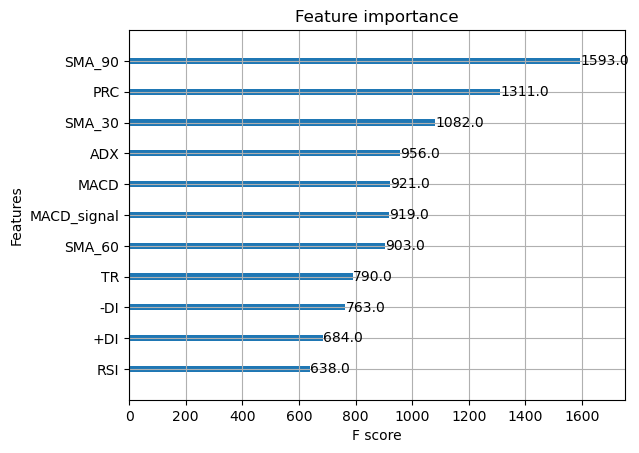

In [ ]:
plot_importance(model);

In [ ]:
y_pred = model.predict(X_test_scaled)
y_pred_proba = model.predict_proba(X_test_scaled)[:, 1]  # Selecting only the positive class probability

test_df['y_pred'] = y_pred
test_df['y_pred_proba'] = y_pred_proba
test_df['date'] = test_dates

# Classification report
classification_report_data = classification_report(y_test, y_pred)
# Print the classification report
print(classification_report_data)


# Compute ROC curve and AUC
fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
roc_auc = auc(fpr, tpr)
print(roc_auc)

# Create interactive Plotly figure
fig = go.Figure()

# Add ROC curve
fig.add_trace(go.Scatter(x=fpr, y=tpr, mode='lines', name=f'ROC curve (AUC = {roc_auc:.2f})',
                         line=dict(color='blue', width=2)))

# Add diagonal reference line
fig.add_trace(go.Scatter(x=[0, 1], y=[0, 1], mode='lines', name='Random Guess',
                         line=dict(color='gray', dash='dash')))

# Add "Ideal Classifier" line
fig.add_trace(go.Scatter(
    x=[0, 0, 1], y=[0, 1, 1], mode='lines', 
    name='Ideal Classifier',
    line=dict(color='green', dash='dash')
))

# Layout settings
fig.update_layout(title="Receiver Operating Characteristic (ROC) Curve",
                  xaxis_title="False Positive Rate",
                  yaxis_title="True Positive Rate",
                  xaxis=dict(range=[0,1]),
                  yaxis=dict(range=[0,1.05]),
                  template="plotly_white")

# Show interactive plot
fig.show()


#test_df.head()

              precision    recall  f1-score   support

           0       0.91      0.69      0.78       385
           1       0.50      0.82      0.62       147

    accuracy                           0.72       532
   macro avg       0.71      0.75      0.70       532
weighted avg       0.80      0.72      0.74       532

0.7972965809700503


In [ ]:
test_df_monthly = test_df.loc[df.groupby(test_df['date'].dt.to_period('M'))['date'].idxmax()]
buys = test_df_monthly[test_df_monthly['y_pred'] == 1]
sells = test_df_monthly[test_df_monthly['y_pred'] == 0]

fig = go.Figure()
fig.add_trace(go.Scatter(x=test_df.date,  y=test_df.PRC,  name='Test'))

# Add Green Up Arrows for most certain class 1 predictions
fig.add_trace(go.Scatter(
    x=buys.date, 
    y=buys.PRC,
    mode='markers',
    marker=dict(color='green', size=15, symbol='triangle-up'),
))

# Add Red Down Arrows for most certain class 0 predictions
fig.add_trace(go.Scatter(
    x=sells.date, 
    y=sells.PRC,
    mode='markers',
    marker=dict(color='red', size=15, symbol='triangle-down'),
))

fig.update_layout(
    height=600  # Adjust height (default is ~450-500)
)

fig.show()
